In [81]:
import pandas as pd
import nltk
import string
from nltk.corpus import stopwords
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import re
from textblob import TextBlob
import csv

In [82]:
with open('alldatasets.csv', newline='') as File:  
    reader = csv.reader(File)
    for row in reader:
        print(row)

['name', 'date', 'text', 'Adj Close', 'Binary', 'Return']
['Elon Musk', '31/05/2022', '@Erdayastronaut Good interview', '31792.31055', '0', '0.002075607']
['Elon Musk', '31/05/2022', '@octonion 🤣', '31792.31055', '0', '0.002075607']
['Elon Musk', '31/05/2022', '10 years since SpaceX’s first mission to @Space_Station https://t.co/30xEtbXlT5', '31792.31055', '0', '0.002075607']
['Elon Musk', '31/05/2022', '@SawyerMerritt Cybertruck body', '31792.31055', '0', '0.002075607']
['Elon Musk', '31/05/2022', '@BillyM2k @PinballReed @crikey_news @ummjackson @cameronwilson You’re humble bro. \n\nBilly’s sense of humor &amp; irreverence is a big part of why people love Dogecoin.', '31792.31055', '0', '0.002075607']
['Elon Musk', '31/05/2022', '@ummjackson Completely useless pos more like it', '31792.31055', '0', '0.002075607']
['Elon Musk', '31/05/2022', '@PinballReed @crikey_news @ummjackson @cameronwilson And Palmer always forgets to mention that he never wrote a single line of Dogecoin code …', 

In [83]:
myfile = 'alldatasets.csv'

In [84]:
df = pd.read_csv(myfile,index_col=None)

In [85]:
df['length'] = df['text'].apply(len)
df.head()

,name,date,text,Adj Close,Binary,Return,length
0,Elon Musk,31/05/2022,@Erdayastronaut Good interview,31792.31055,0,0.002076,30
1,Elon Musk,31/05/2022,@octonion 🤣,31792.31055,0,0.002076,11
2,Elon Musk,31/05/2022,10 years since SpaceX’s first mission to @Spac...,31792.31055,0,0.002076,79
3,Elon Musk,31/05/2022,@SawyerMerritt Cybertruck body,31792.31055,0,0.002076,30
4,Elon Musk,31/05/2022,@BillyM2k @PinballReed @crikey_news @ummjackso...,31792.31055,0,0.002076,167


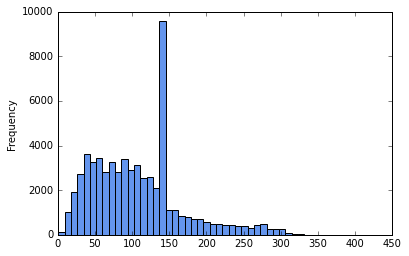

In [86]:
df['length'].plot(bins=50, kind='hist', color='cornflowerblue') 
plt.savefig('lengthall.png')

array([[<AxesSubplot:title={'center':'Barack Obama'}>,
        <AxesSubplot:title={'center':'Elon Musk'}>],
       [<AxesSubplot:title={'center':'Jim Cramer'}>, <AxesSubplot:>]],
      dtype=object)

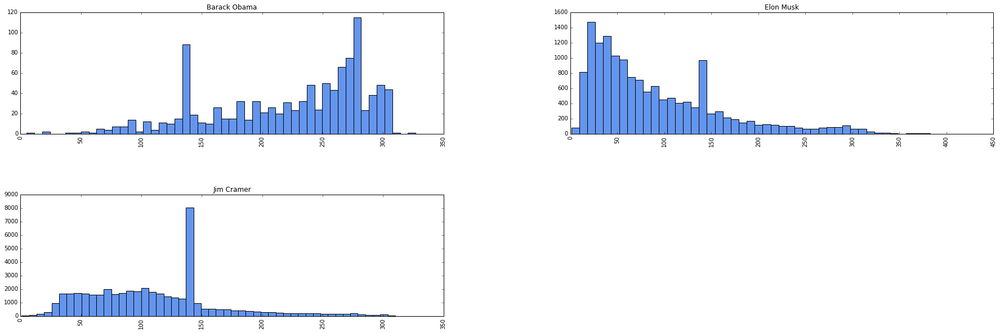

In [87]:
df.hist(column='length', by='name', bins=50,figsize=(30,10), color='cornflowerblue')
#plt.savefig('lengthbyname.png')

array([[<AxesSubplot:title={'center':'Barack Obama'}>,
        <AxesSubplot:title={'center':'Elon Musk'}>],
       [<AxesSubplot:title={'center':'Jim Cramer'}>, <AxesSubplot:>]],
      dtype=object)

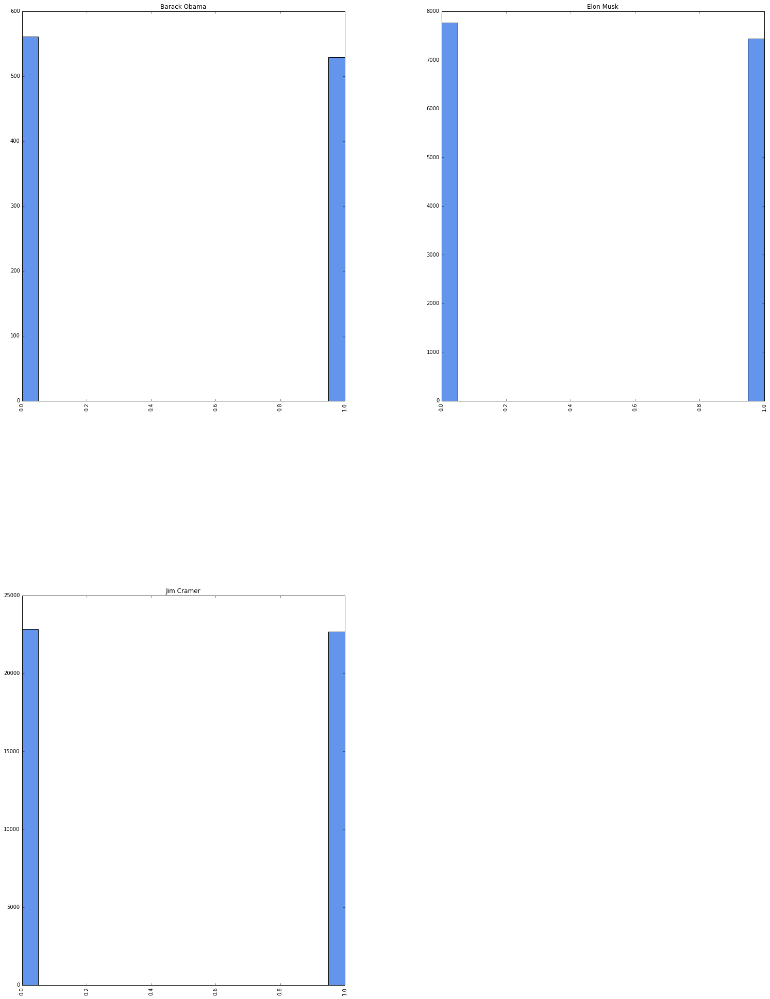

In [88]:
df.hist(column='Binary', by='name', bins=20,figsize=(25,35), color='cornflowerblue')
#plt.savefig('Binarybyname.png')

In [89]:
def text_process(mess):
    """
    Takes in a string of text, then performs the following:
    1. Remove all punctuations
    2. Remove all stopwords
    3. Returns a list of the cleaned text
    """
    # Check characters to see if they are in punctuation
    nopunc = [char for char in mess if char not in string.punctuation]

    # Join the characters again to form the string.
    nopunc = ''.join(nopunc)
    
    # Now just remove any stopwords
    return [word for word in nopunc.split() if word.lower() not in stopwords.words('english')]

In [90]:
def clean_text(text_cleaned):
    text_cleaned = re.sub(r'@[A-Za-z0-9]+', '', text_cleaned) #Removing mentions
    text_cleaned = re.sub(r'#', '', text_cleaned) #Removing the '#' symbol
    text_cleaned = re.sub(r'RT[\s]+', '', text_cleaned) #Removing RT
    text_cleaned = re.sub(r'https?:\/\/\S+', '', text_cleaned) #Remove the hyper link
    text_cleaned = re.sub(r'b', '', text_cleaned) #Remove the b at the begining
    #text_cleaned = re.sub(r' '', ', '', text_cleaned) #Remove the ', and so on...


    return text_cleaned

#Cleaning the text
df['text'] = df['text'].apply(clean_text)

df

,name,date,text,Adj Close,Binary,Return,length
0,Elon Musk,31/05/2022,Good interview,31792.310550,0,0.002076,30
1,Elon Musk,31/05/2022,🤣,31792.310550,0,0.002076,11
2,Elon Musk,31/05/2022,10 years since SpaceX’s first mission to _Stat...,31792.310550,0,0.002076,79
3,Elon Musk,31/05/2022,Cyertruck ody,31792.310550,0,0.002076,30
4,Elon Musk,31/05/2022,_news You’re humle ro. \n\nBilly’s sense o...,31792.310550,0,0.002076,167
...,...,...,...,...,...,...,...
61830,Jim Cramer,01/06/2017,"no, I said that you shouldn't give up on the s...",2407.879883,1,0.051764,151
61831,Jim Cramer,01/06/2017,take out your cost and let the rest ride..,2407.879883,1,0.051764,66
61832,Jim Cramer,01/06/2017,: . returns to one of his favorite market moni...,2407.879883,1,0.051764,140
61833,Jim Cramer,01/06/2017,No real ojection except there is no real catal...,2407.879883,1,0.051764,132


In [91]:
#Create a function to get the subjectivity (how subjective the text is)
def get_subjectivity(text_cleaned):
    return TextBlob(text_cleaned).sentiment.subjectivity

#Create a function to get the polarity(how positive or negative the text is)
def get_polarity(text_cleaned):
    return TextBlob(text_cleaned).sentiment.polarity

#Create two new columns
df['Subjectivity'] = df['text'].apply(get_subjectivity)
df['Polarity'] = df['text'].apply(get_polarity)

#Show the new df with the new colummns

df

,name,date,text,Adj Close,Binary,Return,length,Subjectivity,Polarity
0,Elon Musk,31/05/2022,Good interview,31792.310550,0,0.002076,30,0.600000,0.70
1,Elon Musk,31/05/2022,🤣,31792.310550,0,0.002076,11,0.000000,0.00
2,Elon Musk,31/05/2022,10 years since SpaceX’s first mission to _Stat...,31792.310550,0,0.002076,79,0.333333,0.25
3,Elon Musk,31/05/2022,Cyertruck ody,31792.310550,0,0.002076,30,0.000000,0.00
4,Elon Musk,31/05/2022,_news You’re humle ro. \n\nBilly’s sense o...,31792.310550,0,0.002076,167,0.600000,0.50
...,...,...,...,...,...,...,...,...,...
61830,Jim Cramer,01/06/2017,"no, I said that you shouldn't give up on the s...",2407.879883,1,0.051764,151,0.780000,0.91
61831,Jim Cramer,01/06/2017,take out your cost and let the rest ride..,2407.879883,1,0.051764,66,0.000000,0.00
61832,Jim Cramer,01/06/2017,: . returns to one of his favorite market moni...,2407.879883,1,0.051764,140,0.650000,0.35
61833,Jim Cramer,01/06/2017,No real ojection except there is no real catal...,2407.879883,1,0.051764,132,0.300000,-0.10


In [92]:
#Create a function to compute the negative, neutral and positive analysis
def get_analysis(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'
    
#df['Analysis'] = df['Polarity'].apply(get_analysis)

#Show the dataframe
df['Analysis'] = df['Polarity'].apply(get_analysis)
df


,name,date,text,Adj Close,Binary,Return,length,Subjectivity,Polarity,Analysis
0,Elon Musk,31/05/2022,Good interview,31792.310550,0,0.002076,30,0.600000,0.70,Positive
1,Elon Musk,31/05/2022,🤣,31792.310550,0,0.002076,11,0.000000,0.00,Neutral
2,Elon Musk,31/05/2022,10 years since SpaceX’s first mission to _Stat...,31792.310550,0,0.002076,79,0.333333,0.25,Positive
3,Elon Musk,31/05/2022,Cyertruck ody,31792.310550,0,0.002076,30,0.000000,0.00,Neutral
4,Elon Musk,31/05/2022,_news You’re humle ro. \n\nBilly’s sense o...,31792.310550,0,0.002076,167,0.600000,0.50,Positive
...,...,...,...,...,...,...,...,...,...,...
61830,Jim Cramer,01/06/2017,"no, I said that you shouldn't give up on the s...",2407.879883,1,0.051764,151,0.780000,0.91,Positive
61831,Jim Cramer,01/06/2017,take out your cost and let the rest ride..,2407.879883,1,0.051764,66,0.000000,0.00,Neutral
61832,Jim Cramer,01/06/2017,: . returns to one of his favorite market moni...,2407.879883,1,0.051764,140,0.650000,0.35,Positive
61833,Jim Cramer,01/06/2017,No real ojection except there is no real catal...,2407.879883,1,0.051764,132,0.300000,-0.10,Negative


In [93]:
#Print all of the positive tweets 3283 out 6699 are positives
j = 1
sorted_df = df.sort_values(by=['Polarity'])
for i in range(0, sorted_df.shape[0]):
    if (sorted_df['Analysis'][i] == 'Positive'):  
        print(str(j) + ') '+sorted_df['text'][i])
        print()
        j = j+1
        

        
#print the negative tweets. 861 out 6699
j = 1
sorted_df = df.sort_values(by=['Polarity'], ascending = False)
for i in range(0, sorted_df.shape[0]):
    if (sorted_df['Analysis'][i] == 'Negative'):  
        print(str(j) + ') '+sorted_df['text'][i])
        print()
        j = j+1
        
        
#print the neutral tweets.
j = 1
sorted_df = df.sort_values(by=['Polarity'], ascending = False)
for i in range(0, sorted_df.shape[0]):
    if (sorted_df['Analysis'][i] == 'Neutral'):  
        print(str(j) + ') '+sorted_df['text'][i])
        print()
        j = j+1

1)  Good interview

2) 10 years since SpaceX’s first mission to _Station 

3)   _news   You’re humle ro. 

Billy’s sense of humor &amp; irreverence is a ig part of why people love Dogecoin.

4)   _news   For AI and most things, Python. JavaScript for we stuff. 

For high performance or tight code, C/C++, spiced up with some assemly.

5)       Maye if they do the opposite, Twitter will e a much etter experience – just an idea

6)  _news   My kids wrote etter code when they were 12 than the nonsense script Jackson sent me. 

Like I said, if it’s so great, he should share it with the world and make everyone’s experience with Twitter etter. If he does, you will see what I mean.

Jackson Palmer is a tool.

7)       Interesting

8)  Yeah, maye a smidge higher …

9)  I support you, Bo! Some ots are good.

10)     The Democrat vs Repulican trialism among otherwise intelligent people is most distressing.

Demonizing everyone who would vote for an alternate party is not constructive.

11)   I’m 

array([[<AxesSubplot:title={'center':'Barack Obama'}>,
        <AxesSubplot:title={'center':'Elon Musk'}>],
       [<AxesSubplot:title={'center':'Jim Cramer'}>, <AxesSubplot:>]],
      dtype=object)

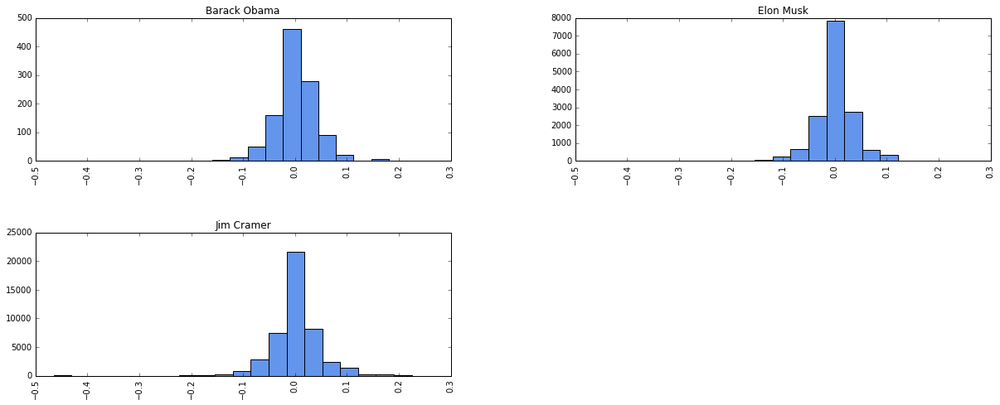

In [94]:
df.hist(column='Return', by='name', bins=20,figsize=(20,8),color='cornflowerblue')
#plt.savefig('returnbyname.png')


array([[<AxesSubplot:title={'center':'Barack Obama'}>,
        <AxesSubplot:title={'center':'Elon Musk'}>],
       [<AxesSubplot:title={'center':'Jim Cramer'}>, <AxesSubplot:>]],
      dtype=object)

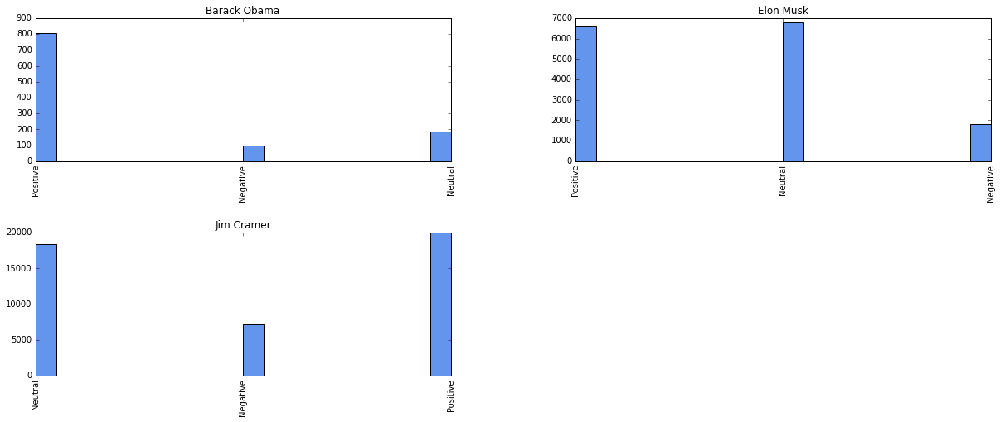

In [95]:
df.hist(column='Analysis', by='name', bins=20,figsize=(20,8),color='cornflowerblue')
#plt.savefig('analysisbyname.png')


array([<AxesSubplot:title={'center':'0'}>,
       <AxesSubplot:title={'center':'1'}>], dtype=object)

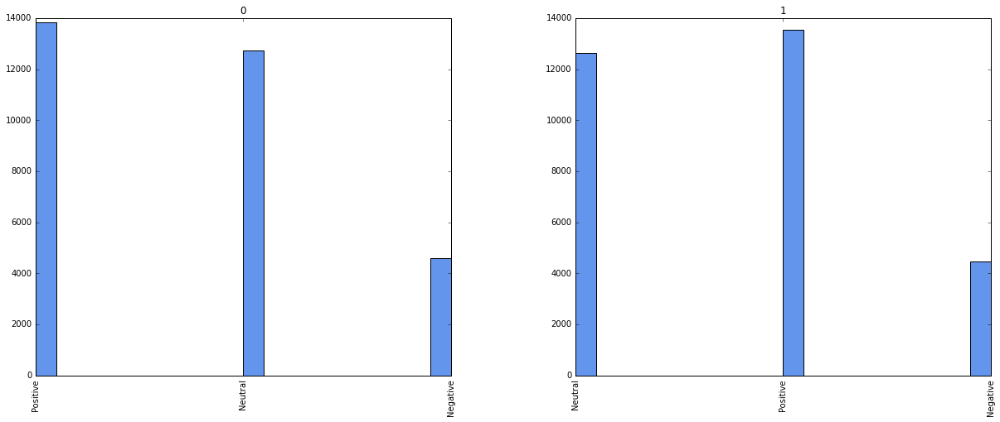

In [96]:
df.hist(column='Analysis', by='Binary', bins=20,figsize=(20,8),color='cornflowerblue')
#plt.savefig('analysisbybinary.png')


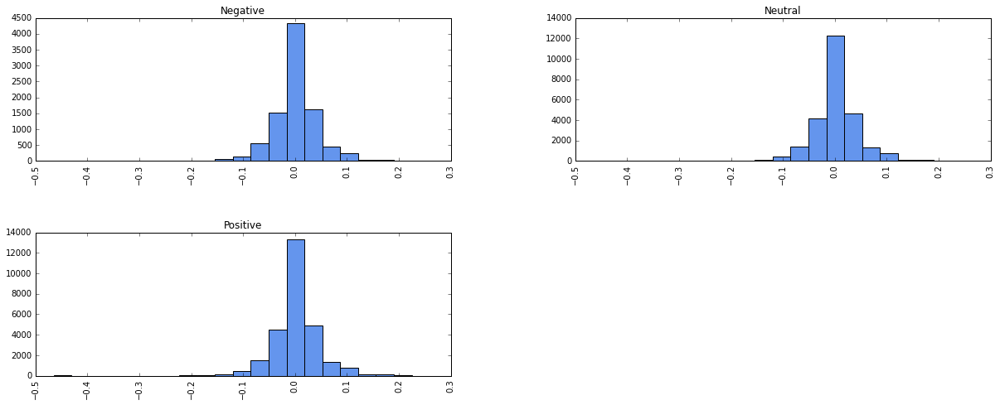

In [97]:
df.hist(column='Return', by='Analysis', bins=20,figsize=(20,8),color='cornflowerblue')
plt.savefig('returnbyanalysis.png')


array([<AxesSubplot:title={'center':'0'}>,
       <AxesSubplot:title={'center':'1'}>], dtype=object)

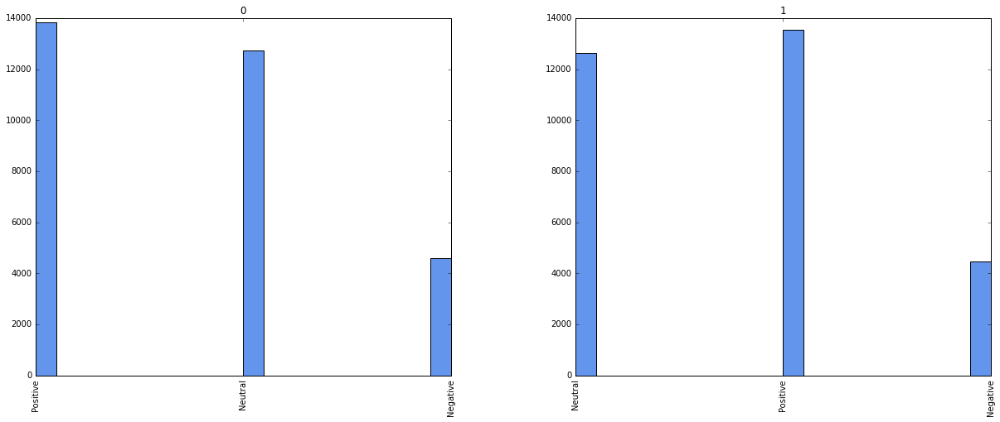

In [98]:
df.hist(column='Analysis', by='Binary', bins=20,figsize=(20,8),color='cornflowerblue')
#plt.savefig('analysisbybinary.png')

0                                           Good interview
2        10 years since SpaceX’s first mission to _Stat...
4          _news   You’re humle ro. \n\nBilly’s sense o...
7          _news   For AI and most things, Python. Java...
10             Maye if they do the opposite, Twitter wi...
                               ...                        
61822    of course Nicaragua actually is trying to get ...
61828    New money in for the month? $PANW good q? Poss...
61829    : HP Inc CEO tells  an intern helped spur 'the...
61830    no, I said that you shouldn't give up on the s...
61832    : . returns to one of his favorite market moni...
Name: text, Length: 27366, dtype: object


The percentage of positive tweets is: 44.3


6         _news   And Palmer always forgets to mention ...
14       _news   You falsely claimed ur lame snippet of...
16                                    Very strange indeed!
19            Yes. It’s safe to say that Mackenzie [ahe...
25          True. Tesla was

Text(0.5, 1.0, '% Sentiment Distribution')

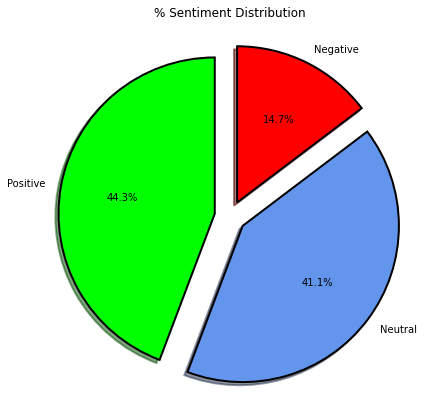

In [99]:
#Get the percentage of positive tweets
ptweets = df[df.Analysis == 'Positive']
ptweets = ptweets['text']

print(ptweets)
print('\n')
print('The percentage of positive tweets is:', round((ptweets.shape[0] / df.shape[0]) * 100, 1))
print('\n')

#Get the negative tweets and his percentage
ntweets = df[df.Analysis == 'Negative']
ntweets = ntweets['text']


print(ntweets)
print('\n')
print('The percentage of negative tweets is:', round( (ntweets.shape[0] / df.shape[0]) * 100, 1))
print('\n')

#Get the neutral tweets and his percentage
neu_tweets = df[df.Analysis == 'Neutral']
neu_tweets = neu_tweets['text']


print(neu_tweets)
print('\n')
print('The percentage of neutral tweets is:', round( (neu_tweets.shape[0] / df.shape[0]) * 100, 1))
print('\n')


fig = plt.figure(figsize=(7,7))
colors = ('lime', 'cornflowerblue', 'red')
wp = {'linewidth':2, 'edgecolor':'black'}
tags = df['Analysis'].value_counts()
explode= (0.1,0.1,0.1)
tags.plot(kind='pie', autopct='%1.1f%%', shadow=True, colors = colors,
        startangle=90, wedgeprops = wp, explode = explode, label='')
plt.title('% Sentiment Distribution')
#plt.savefig('total%.png')

(array([0, 1, 2]),
 [Text(0, 0, 'Elon Musk'),
  Text(1, 0, 'Barack Obama'),
  Text(2, 0, 'Jim Cramer')])

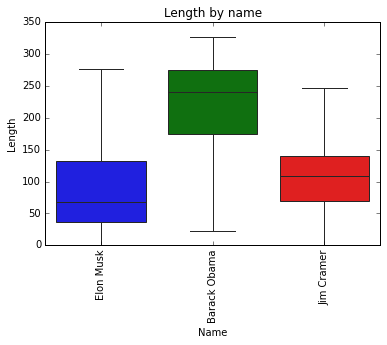

In [100]:
#create seaborn boxplots by group
sns.boxplot(x='name', y='length', notch = False,
            data=df, showfliers = False) .set (title='Length by name')

#modify axis labels
plt.xlabel('Name')
plt.ylabel('Length')
plt.xticks(rotation=90)
#plt.savefig('boxplotnamebylength.png')


(array([0, 1, 2]),
 [Text(0, 0, 'Elon Musk'),
  Text(1, 0, 'Barack Obama'),
  Text(2, 0, 'Jim Cramer')])

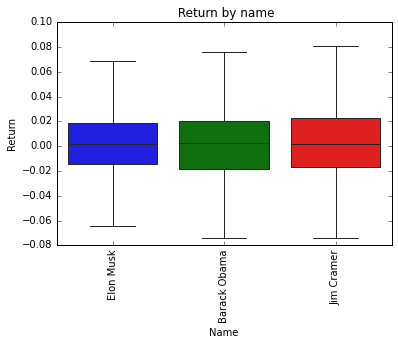

In [101]:
import seaborn as sns

#create seaborn boxplots by group
sns.boxplot(x='name', y='Return', notch = False,
            data=df, showfliers = False) .set (title=' Return by name')

#modify axis labels
plt.xlabel('Name')
plt.ylabel('Return')
plt.xticks(rotation=90)

(array([0, 1, 2]),
 [Text(0, 0, 'Elon Musk'),
  Text(1, 0, 'Barack Obama'),
  Text(2, 0, 'Jim Cramer')])

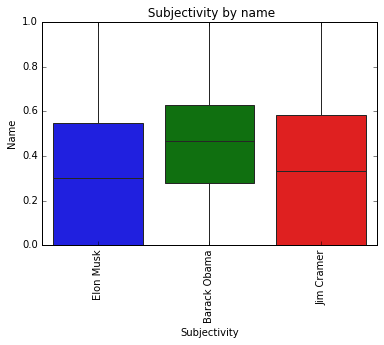

In [102]:
#create seaborn boxplots by group
sns.boxplot(x='name', y='Subjectivity', notch = False,
            data=df, showfliers = False) .set (title=' Subjectivity by name')

#modify axis labels
plt.xlabel('Subjectivity')
plt.ylabel('Name')
plt.xticks(rotation=90)

(array([0, 1, 2]),
 [Text(0, 0, 'Elon Musk'),
  Text(1, 0, 'Barack Obama'),
  Text(2, 0, 'Jim Cramer')])

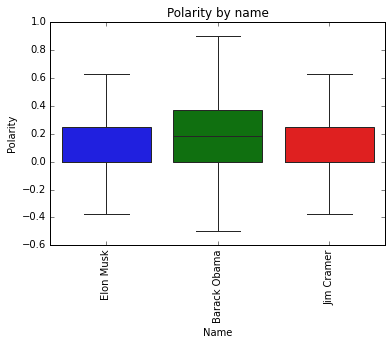

In [103]:
#create seaborn boxplots by group
sns.boxplot(x='name', y='Polarity', notch = False,
            data=df, showfliers = False) .set (title='Polarity by name')

#modify axis labels
plt.xlabel('Name')
plt.ylabel('Polarity')
plt.xticks(rotation=90)

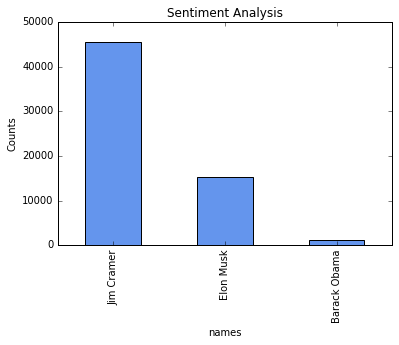

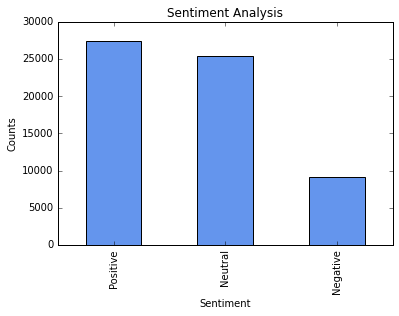

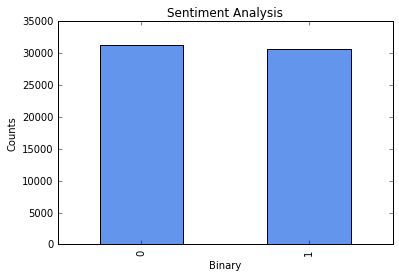

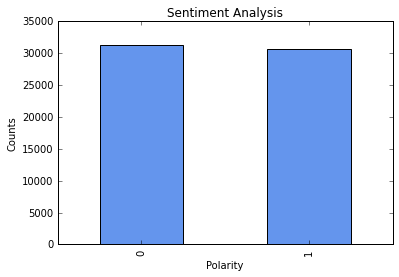

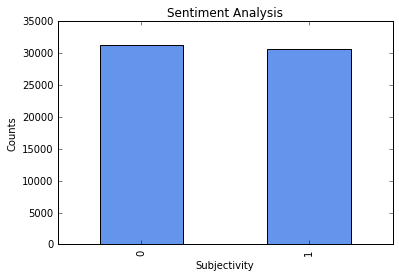

<Figure size 432x288 with 0 Axes>

In [104]:
#Show the value counts
df['name'].value_counts()

#Plot and visualise the counts
plt.title('Sentiment Analysis')
plt.xlabel('names')
plt.ylabel('Counts')
df['name'].value_counts().plot(kind='bar', color='cornflowerblue')
#plt.savefig('countsbyname.png')
plt.show()

#Show the value counts
df['Analysis'].value_counts()

#Plot and visualise the counts
plt.title('Sentiment Analysis')
plt.xlabel('Sentiment')
plt.ylabel('Counts')
df['Analysis'].value_counts().plot(kind='bar', color='cornflowerblue')
plt.show()
#plt.savefig('countsbysentiment.png')

#Show the value counts
df['Binary'].value_counts()

#Plot and visualise the counts
plt.title('Sentiment Analysis')
plt.xlabel('Binary')
plt.ylabel('Counts')
df['Binary'].value_counts().plot(kind='bar', color='cornflowerblue')
plt.show()
#plt.savefig('countsbybinary.png')

#Show the value counts
df['Polarity'].value_counts()

#Plot and visualise the counts
plt.title('Sentiment Analysis')
plt.xlabel('Polarity')
plt.ylabel('Counts')
df['Binary'].value_counts().plot(kind='bar', color='cornflowerblue')
plt.show()
#plt.savefig('countsbypolarity.png')


#Show the value counts
df['Subjectivity'].value_counts()

#Plot and visualise the counts
plt.title('Sentiment Analysis')
plt.xlabel('Subjectivity')
plt.ylabel('Counts')
df['Binary'].value_counts().plot(kind='bar', color='cornflowerblue')
plt.show()
plt.savefig('countsbysubjectivity.png')


In [105]:
#Perform count vectorization on the data and create a bigram model
from sklearn.feature_extraction.text import CountVectorizer
vect = CountVectorizer(ngram_range=(1,2)).fit(df['text'])


#Get the number of features and print the first 20 ones
feature_names = vect.get_feature_names()
print('Number of features: {}\n'.format(len(feature_names)))
print('First 20 features:\n {}'.format(feature_names[:20]))


#Build the model
X = df['text']
Y = df['Analysis']
X = vect.transform(X)

Number of features: 360076

First 20 features:
 ['00', '00 am', '00 and', '00 eastern', '00 et', '00 he', '00 is', '00 nice', '00 oh', '00 on', '00 pm', '00 sharp', '00 so', '00 stinging', '00 there', '00 to', '00 we', '00 wednesday', '00 would', '000']


In [106]:
from sklearn.model_selection import train_test_split

#Put the training(0.8) and testing data(0.2)
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

print('Size of x_train:', (x_train.shape))
print('Size of y_train:', (y_train.shape))
print('Size of x_test:', (x_test.shape))
print('Size of y_test:', (y_test.shape))

Size of x_train: (49468, 360076)
Size of y_train: (49468,)
Size of x_test: (12367, 360076)
Size of y_test: (12367,)


In [107]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

#First train the data into a Logistic Regression Model. Load and fit the model.
#Predict it and calculate the accuracy of the model.
logreg = LogisticRegression()
logreg.fit(x_train, y_train)
logreg_pred = logreg.predict(x_test)
logreg_acc = accuracy_score(logreg_pred, y_test)
print('Test accuracy: {:.2f}%'.format(logreg_acc*100))

Test accuracy: 91.28%


In [108]:
print(confusion_matrix(y_test, logreg_pred))
print('\n')
print(classification_report(y_test, logreg_pred))

[[1273  284  252]
 [  30 4877   91]
 [ 137  284 5139]]


              precision    recall  f1-score   support

    Negative       0.88      0.70      0.78      1809
     Neutral       0.90      0.98      0.93      4998
    Positive       0.94      0.92      0.93      5560

    accuracy                           0.91     12367
   macro avg       0.91      0.87      0.88     12367
weighted avg       0.91      0.91      0.91     12367



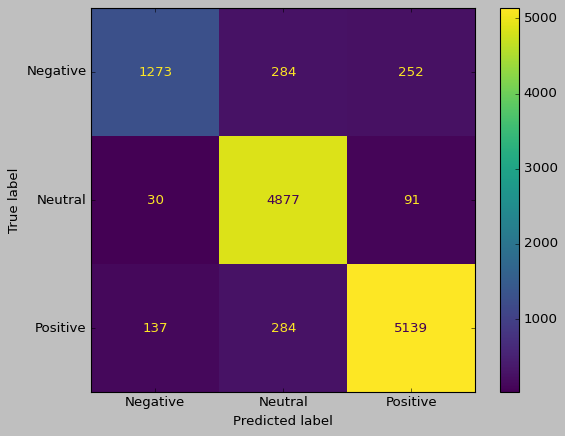

In [109]:
#There is also another way to visualize the confusion matrix
from matplotlib import style
style.use('classic')
cm = confusion_matrix(y_test, logreg_pred, labels=logreg.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels=logreg.classes_)
disp.plot()
#plt.savefig('confussionatrixLR.png')

In [110]:
from sklearn.model_selection import GridSearchCV


param_grid={'C':[0.001, 0.01, 0.1, 1, 10]}
grid = GridSearchCV(LogisticRegression(), param_grid)
grid.fit(x_train, y_train)

GridSearchCV(estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10]})

In [111]:
print('Best parameters:', grid.best_params_)


y_pred = grid.predict(x_test)


#As we can see, there is a small improvement in the model accuracy
logreg_acc = accuracy_score(y_pred, y_test)
print('Test accuracy: {:.2f}%'.format(logreg_acc*100))

Best parameters: {'C': 10}
Test accuracy: 92.16%


In [112]:
#The updated confusion matrix
print(confusion_matrix(y_test, y_pred))
print('\n')
print(classification_report(y_test, y_pred))

[[1328  246  235]
 [  31 4875   92]
 [ 137  229 5194]]


              precision    recall  f1-score   support

    Negative       0.89      0.73      0.80      1809
     Neutral       0.91      0.98      0.94      4998
    Positive       0.94      0.93      0.94      5560

    accuracy                           0.92     12367
   macro avg       0.91      0.88      0.89     12367
weighted avg       0.92      0.92      0.92     12367



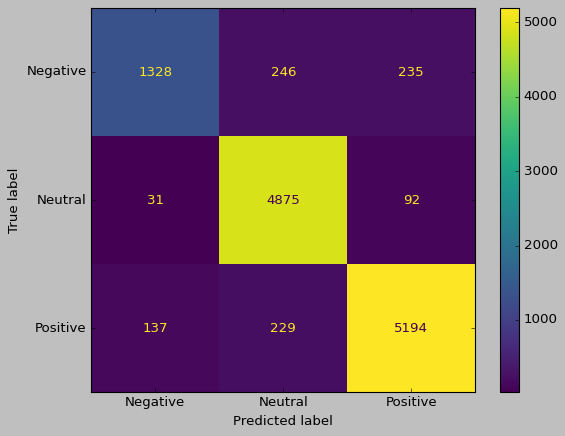

In [113]:
#There is also another way to visualize the confusion matrix
from matplotlib import style
style.use('classic')
cm_svm = confusion_matrix(y_test, y_pred, labels=logreg.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm_svm, display_labels=logreg.classes_)
disp.plot()
#plt.savefig('confussionatrixLRGrid.png')

In [114]:
#Run the model on one more algorithm. The support vector machine
from sklearn.svm import LinearSVC

#Load the classifier and fit the data into the model
SVCmodel = LinearSVC()
SVCmodel.fit(x_train, y_train)

LinearSVC()

In [115]:
#Use the values for a test data
svc_pread = SVCmodel.predict(x_test)

#Calculate the accuracy
svc_acc = accuracy_score(svc_pread, y_test)
print('The test accuracy is: {:.2f}%'.format(svc_acc*100))

The test accuracy is: 92.86%


In [116]:
#Put the confussion matrix and the classification report
print(confusion_matrix(y_test, svc_pread))
print('\n')
print(classification_report(y_test, svc_pread))

[[1374  208  227]
 [  34 4870   94]
 [ 131  189 5240]]


              precision    recall  f1-score   support

    Negative       0.89      0.76      0.82      1809
     Neutral       0.92      0.97      0.95      4998
    Positive       0.94      0.94      0.94      5560

    accuracy                           0.93     12367
   macro avg       0.92      0.89      0.90     12367
weighted avg       0.93      0.93      0.93     12367



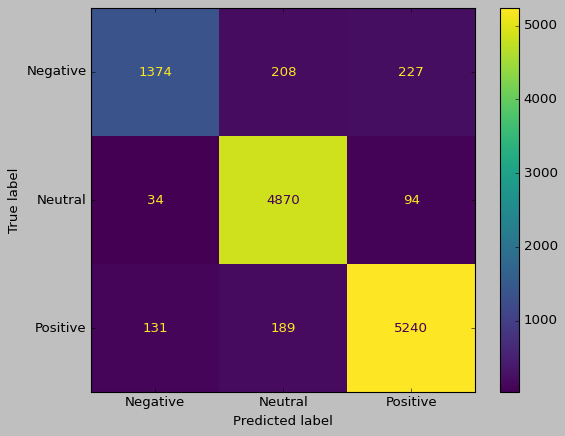

In [117]:
#There is also another way to visualize the confusion matrix
from matplotlib import style
style.use('classic')
cm_svm = confusion_matrix(y_test, svc_pread, labels=logreg.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm_svm, display_labels=logreg.classes_)
disp.plot()
#plt.savefig('confussionatrixSVC.png')

In [118]:
#Define the parameters for the SVM model, the grid, and fit the data.
grid = {
    'C':[0.01, 0.1, 1, 10],
    'kernel':['linear','poly','rbf','sigmoid'],
    'degree':[1,3,5,7],
    'gamma':[0.01,1]
}
grid = GridSearchCV(SVCmodel, param_grid)
grid.fit(x_train, y_train)

GridSearchCV(estimator=LinearSVC(), param_grid={'C': [0.001, 0.01, 0.1, 1, 10]})

In [119]:
#Finally get the best parameter, index, estimator and score. 
print('The best parameter is:', grid.best_params_)
print('The best index is:', grid.best_index_)
print('The best estimator is:', grid.best_estimator_)
print('The best score is:', grid.best_score_)

The best parameter is: {'C': 10}
The best index is: 4
The best estimator is: LinearSVC(C=10)
The best score is: 0.920898399615322


In [120]:
#Then break the value for the given excess
y_pred_svc = grid.predict(x_test)

logreg_acc = accuracy_score(y_pred_svc,y_test)
print('The test accuracy is: {:.2f}%'.format(logreg_acc*100))

The test accuracy is: 92.88%


In [121]:
print(confusion_matrix(y_test,y_pred_svc))
print('\n')
print(classification_report(y_test,y_pred_svc))

[[1386  203  220]
 [  33 4868   97]
 [ 138  190 5232]]


              precision    recall  f1-score   support

    Negative       0.89      0.77      0.82      1809
     Neutral       0.93      0.97      0.95      4998
    Positive       0.94      0.94      0.94      5560

    accuracy                           0.93     12367
   macro avg       0.92      0.89      0.90     12367
weighted avg       0.93      0.93      0.93     12367



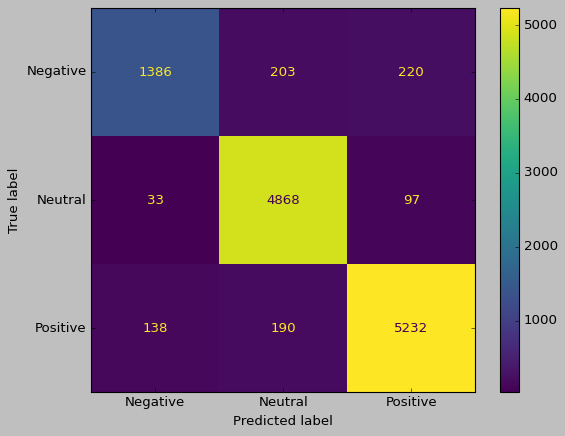

In [122]:
#There is also another way to visualize the confusion matrix
from matplotlib import style
style.use('classic')
cm_grid = confusion_matrix(y_test, y_pred_svc, labels=logreg.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm_grid, display_labels=logreg.classes_)
disp.plot()
#plt.savefig('confussionatrixGridSVC.png')

In [123]:
from sklearn.naive_bayes import MultinomialNB

model = MultinomialNB()
model.fit(x_train, y_train)

MultinomialNB()

In [125]:
#Use the values for a test data
mnb_pread = model.predict(x_test)

#Calculate the accuracy
mnb_acc = accuracy_score(mnb_pread, y_test)
print('The test accuracy is: {:.2f}%'.format(mnb_acc*100))

The test accuracy is: 70.42%


In [126]:
#Put the confussion matrix and the classification report
print(confusion_matrix(y_test, mnb_pread))
print('\n')
print(classification_report(y_test, mnb_pread))

[[ 499  186 1124]
 [  74 2970 1954]
 [  96  224 5240]]


              precision    recall  f1-score   support

    Negative       0.75      0.28      0.40      1809
     Neutral       0.88      0.59      0.71      4998
    Positive       0.63      0.94      0.76      5560

    accuracy                           0.70     12367
   macro avg       0.75      0.60      0.62     12367
weighted avg       0.75      0.70      0.68     12367



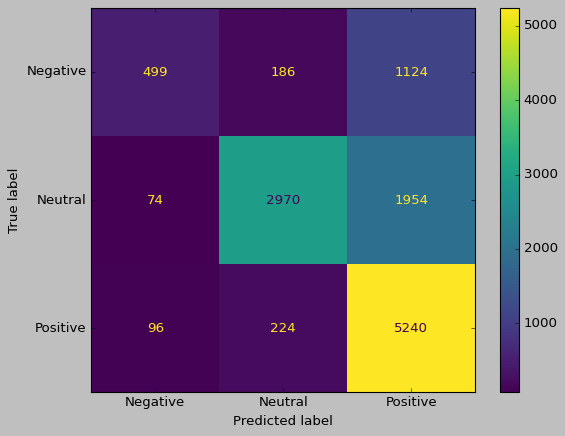

In [129]:
#There is also another way to visualize the confusion matrix
from matplotlib import style
style.use('classic')
cm_mnb = confusion_matrix(y_test, mnb_pread, labels=logreg.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm_mnb, display_labels=logreg.classes_)
disp.plot()
plt.savefig('confussionatrixGNB.png')

In [75]:
#from sklearn.naive_bayes import GaussianNB

In [76]:
#gnb = GaussianNB()
#gnb.fit(x_train.toarray(), y_train)


In [77]:
#Use the values for a test data
#gnb_pread = gnb.predict(x_test.toarray())

#Calculate the accuracy
#gnb_acc = accuracy_score(gnb_pread, y_test)
#print('The test accuracy is: {:.2f}%'.format(gnb_acc*100))

In [78]:
#Put the confussion matrix and the classification report
#print(confusion_matrix(y_test, gnb_pread))
#print('\n')
#print(classification_report(y_test, gnb_pread))

In [79]:
#There is also another way to visualize the confusion matrix
#from matplotlib import style
#style.use('classic')

















#cm_gnb = confusion_matrix(y_test, gnb_pread, labels=logreg.classes_)
#disp = ConfusionMatrixDisplay(confusion_matrix = cm_gnb, display_labels=logreg.classes_)
#disp.plot()

In [80]:
#Plot the polarity and subjectivity. This is all the tweets. Our goal will be to generate this plot of every guy..
#plt.figure(figsize=(8,6))
#for i in range (0, df.shape[0]):
    #plt.scatter(df['Polarity'][i], df['Subjectivity'][i], color= 'Blue')

#plt.title('Sentiment Analysis')
#plt.xlabel('Polarity')
#plt.ylabel('Subjectivity')

